MobileNetV2: 476,210 / 2,287,922 parameters trainable (20.8%)


Epoch 1/5: 100%|██████████| 225/225 [12:44<00:00,  3.40s/it]


Epoch 1: Train Acc: 76.44%, Val Acc: 95.20%


Epoch 2/5: 100%|██████████| 225/225 [08:34<00:00,  2.29s/it]


Epoch 2: Train Acc: 93.93%, Val Acc: 96.80%


Epoch 3/5: 100%|██████████| 225/225 [10:42<00:00,  2.86s/it]


Epoch 3: Train Acc: 96.34%, Val Acc: 95.60%


Epoch 4/5: 100%|██████████| 225/225 [08:29<00:00,  2.26s/it]


Epoch 4: Train Acc: 97.73%, Val Acc: 95.20%


Epoch 5/5: 100%|██████████| 225/225 [10:47<00:00,  2.88s/it]


Epoch 5: Train Acc: 98.59%, Val Acc: 96.00%


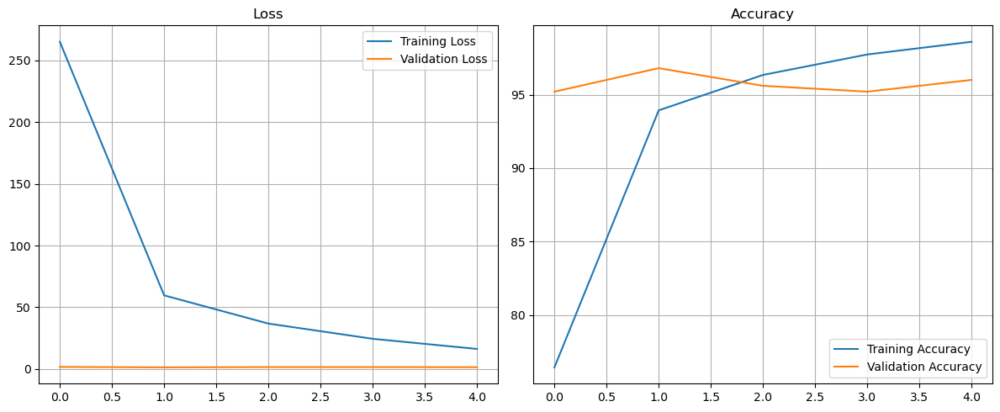

Test Accuracy: 98.80%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      0.80      0.89         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [76]:
# Import necessary programmes
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms - loads default pretrained weights for MobileNetV2 (trained on ImageNet)
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform,
    'valid': transform,
    'test': transform
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

dataloaders = {
    split: DataLoader(image_datasets[split], batch_size=32, shuffle=(split == 'train'), num_workers=4)
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# Load MobileNetV2 model with pretrained weights
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

# Check parameters
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"MobileNetV2: {trainable:,} / {total:,} parameters trainable ({100*trainable/total:.1f}%)")

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")


In [77]:
torch.save(model.state_dict(), "mobilenet_v2_partial_ft.pth")

In [78]:
# Visualise confused species pairs
def show_confused_species(dataset_dir, confused_pairs, n_samples=3):
    """
    This function will display sample images of species the model confused with one another side-by-side.
    """
    test_dir = Path(dataset_dir) / "test"

    for true_class, pred_class in confused_pairs:
        true_imgs = list((test_dir / true_class).glob("*"))
        pred_imgs = list((test_dir / pred_class).glob("*"))

        true_samples = random.sample(true_imgs, min(n_samples, len(true_imgs)))
        pred_samples = random.sample(pred_imgs, min(n_samples, len(pred_imgs)))

        print(f"\nConfused: '{true_class}' predicted as '{pred_class}'")

        fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 3, 5))

        for i in range(n_samples):
            # Actual species images
            if i < len(true_samples):
                axes[0, i].imshow(Image.open(true_samples[i]))
                axes[0, i].set_title(true_class, fontsize=9)
            axes[0, i].axis('off')

            # Predicted species images
            if i < len(pred_samples):
                axes[1, i].imshow(Image.open(pred_samples[i]))
                axes[1, i].set_title(pred_class, fontsize=9)
            axes[1, i].axis('off')

        plt.suptitle(f"'{true_class}' ↔ '{pred_class}'", fontsize=12)
        plt.tight_layout()
        plt.show()



Confused: 'BANDED TIGER MOTH' predicted as 'GARDEN TIGER MOTH'


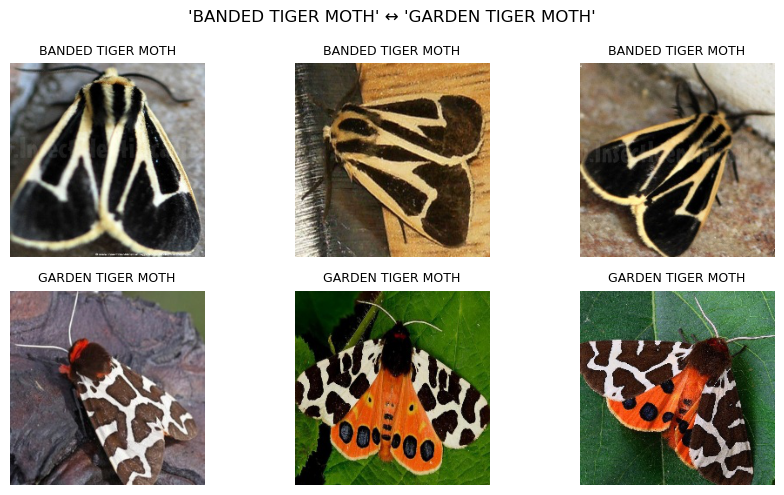


Confused: 'HUMMING BIRD HAWK MOTH' predicted as 'EYED HAWK MOTH'


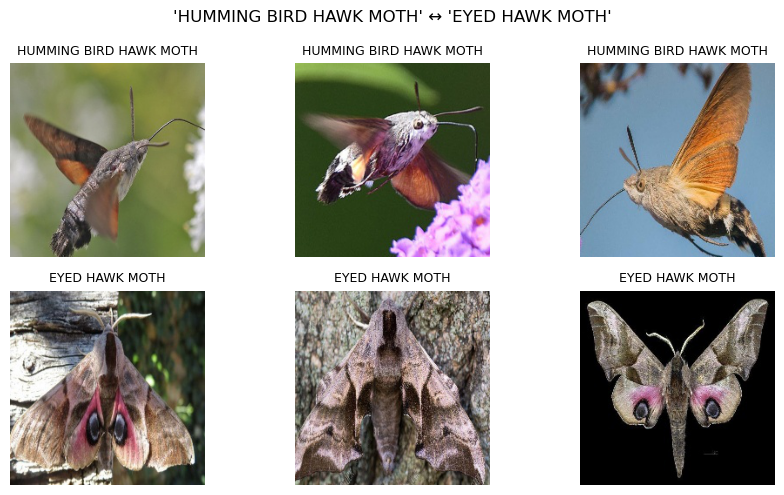


Confused: 'MUSLIN MOTH' predicted as 'SQUARE SPOT RUSTIC MOTH'


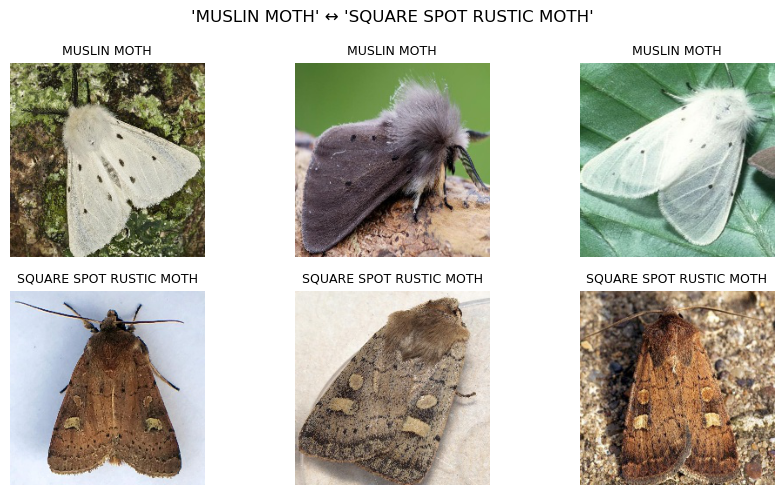

In [79]:
# Define confused class pairs based on the confusion matrix output
confused_pairs_to_plot = [
    ("BANDED TIGER MOTH", "GARDEN TIGER MOTH"),
    ("HUMMING BIRD HAWK MOTH", "EYED HAWK MOTH"),
    ("MUSLIN MOTH", "SQUARE SPOT RUSTIC MOTH")
]

# Call the visualisation function
show_confused_species("../data/kaggle-dataset/archive", confused_pairs_to_plot)

In [84]:
from pathlib import Path  
import numpy as np 
import torch 
import torchvision.transforms as transforms 
from PIL import Image 
import cv2   
from torchvision import models
from torchvision.models import MobileNet_V2_Weights  
from pytorch_grad_cam import GradCAMPlusPlus 
from pytorch_grad_cam.utils.image import show_cam_on_image  

# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-banded-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [83]:
from pathlib import Path  
import numpy as np 
import torch 
import torchvision.transforms as transforms 
from PIL import Image 
import cv2   
from torchvision import models
from torchvision.models import MobileNet_V2_Weights  
from pytorch_grad_cam import ScoreCAM 
from pytorch_grad_cam.utils.image import show_cam_on_image  

# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-banded-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:40<00:00,  1.98it/s]


True

In [85]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-garden-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [87]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-garden-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000002897FE16660>
Traceback (most recent call last):
  File "c:\Users\rebec\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "c:\Users\rebec\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py", line 1576, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'
100%|██████████| 80/80 [00:30<00:00,  2.63it/s]


True

In [88]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/HUMMING BIRD HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-humming-bird-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [89]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/HUMMING BIRD HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-humming-bird-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:29<00:00,  2.72it/s]


True

In [90]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-eyed-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [91]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-eyed-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:29<00:00,  2.71it/s]


True

In [92]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-muslin-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [93]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-muslin-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:30<00:00,  2.65it/s]


True

In [94]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Grad-CAM++ (instead of Score-CAM)
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save visualisation with updated filename
output_path = Path("../cam_outputs/mobilenet_v2/gradcampp-square-spot-rustic-1.jpg") 
cv2.imwrite(str(output_path), visualisation)


True

In [95]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/1.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-square-spot-rustic-1.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:29<00:00,  2.74it/s]


True

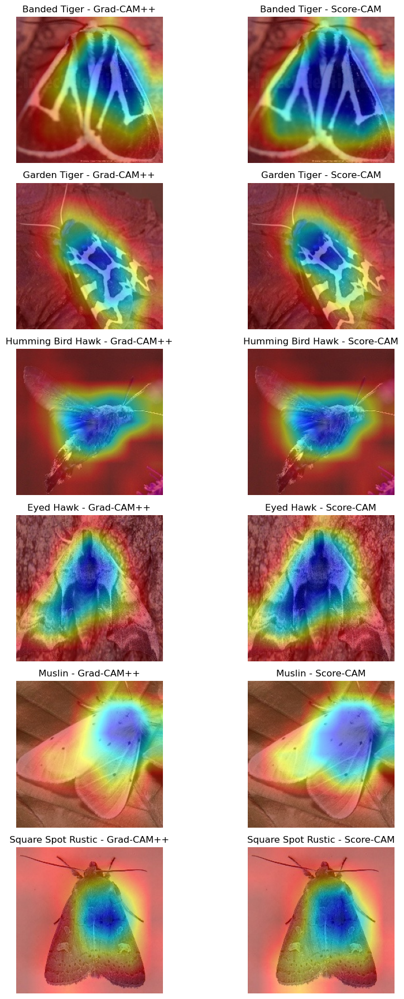

In [96]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Define the folder where EfficientNet CAM outputs are saved
cam_folder = Path("../cam_outputs/mobilenet_v2")

# Define species names (used in filenames)
species = [
    "banded-tiger", "garden-tiger",
    "humming-bird-hawk", "eyed-hawk",
    "muslin", "square-spot-rustic"
]

# Plot settings: N rows (species), 2 columns (Grad-CAM++, Score-CAM)
fig, axs = plt.subplots(len(species), 2, figsize=(10, len(species) * 3))

# Ensure axs is always 2D
if len(species) == 1:
    axs = [axs]

for i, sp in enumerate(species):
    # Updated filenames with "-1" suffix
    score_path = cam_folder / f"score-cam-{sp}-1.jpg"
    grad_path = cam_folder / f"gradcampp-{sp}-1.jpg"

    # Load images
    score_img_bgr = cv2.imread(str(score_path))
    grad_img_bgr = cv2.imread(str(grad_path))

    if score_img_bgr is None or grad_img_bgr is None:
        axs[i, 0].axis("off")
        axs[i, 1].axis("off")
        continue

    score_img = cv2.cvtColor(score_img_bgr, cv2.COLOR_BGR2RGB)
    grad_img = cv2.cvtColor(grad_img_bgr, cv2.COLOR_BGR2RGB)

    # Grad-CAM++ on left
    axs[i, 0].imshow(grad_img)
    axs[i, 0].axis("off")
    axs[i, 0].set_title(f"{sp.replace('-', ' ').title()} - Grad-CAM++")

    # Score-CAM on right
    axs[i, 1].imshow(score_img)
    axs[i, 1].axis("off")
    axs[i, 1].set_title(f"{sp.replace('-', ' ').title()} - Score-CAM")

plt.tight_layout()
plt.show()


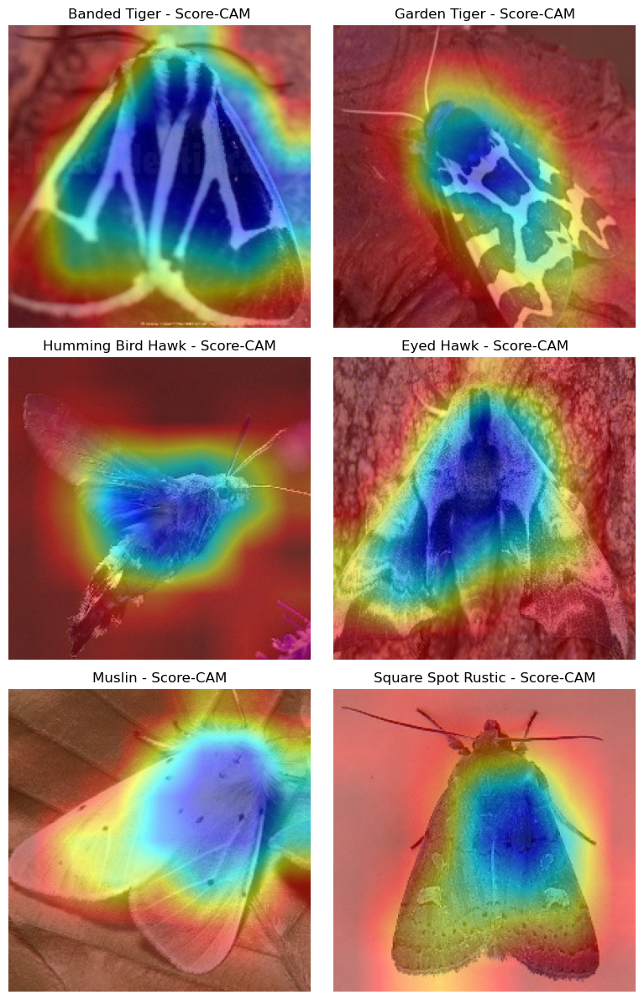

In [99]:
import matplotlib.image as mpimg

# Define Score-CAM image paths for confused pairs
species_pairs = [
    ("banded-tiger", "garden-tiger"),
    ("humming-bird-hawk", "eyed-hawk"),
    ("muslin", "square-spot-rustic")
]

base_path = Path("../cam_outputs/mobilenet_v2")
fig, axs = plt.subplots(len(species_pairs), 2, figsize=(8, len(species_pairs) * 4))

for i, (sp1, sp2) in enumerate(species_pairs):
    img1 = mpimg.imread(base_path / f"score-cam-{sp1}-1.jpg")
    img2 = mpimg.imread(base_path / f"score-cam-{sp2}-1.jpg")

    axs[i, 0].imshow(img1)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"{sp1.replace('-', ' ').title()} - Score-CAM")

    axs[i, 1].imshow(img2)
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"{sp2.replace('-', ' ').title()} - Score-CAM")

plt.tight_layout()
plt.show()


**Hornet Moth vs. Fiery Clearwing Moth**

- Both Score-CAM and Grad-CAM highlight the thorax and transparent wings.
- The model appears to focus heavily on the striped body and wing translucency — features shared by both species.
- Very little attention is paid to species-specific wing venation or antenna structure, which likely contributes to confusion.

**Hummingbird Hawk Moth vs. Eyed Hawk Moth**

- CAMs focus strongly on the thorax and forewings in both species, ignoring the distinctive eyespots of the Eyed Hawk.
- This suggests the model is underutilising critical features that could disambiguate the two species.
- The similar flight posture and blurred wing motion (due to image capture) may also mislead the model, causing reliance on body shape instead of wing patterns.

We will now continue with Score-CAM & Grad-CAM ++ to evaluate model attention using top confused pairs

In [103]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/HUMMING BIRD HAWK MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-humming-bird-hawk-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:27<00:00,  2.87it/s]


True

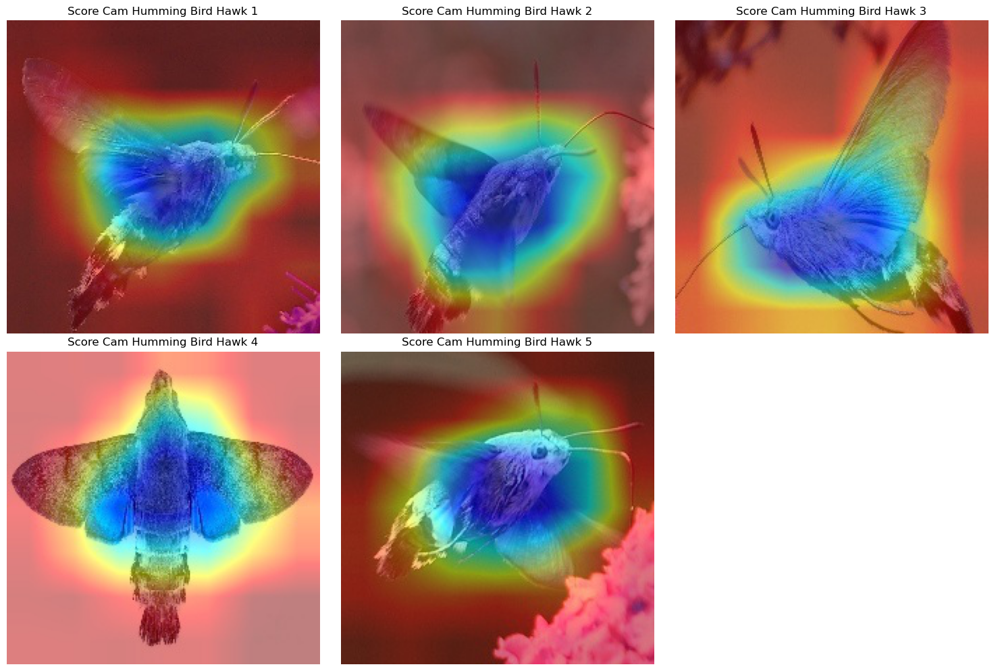

In [104]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
import glob

# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Eyed Hawk Moth
image_paths = sorted(base_path.glob("score-cam-humming-bird-hawk-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [108]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-eyed-hawk-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:28<00:00,  2.78it/s]


True

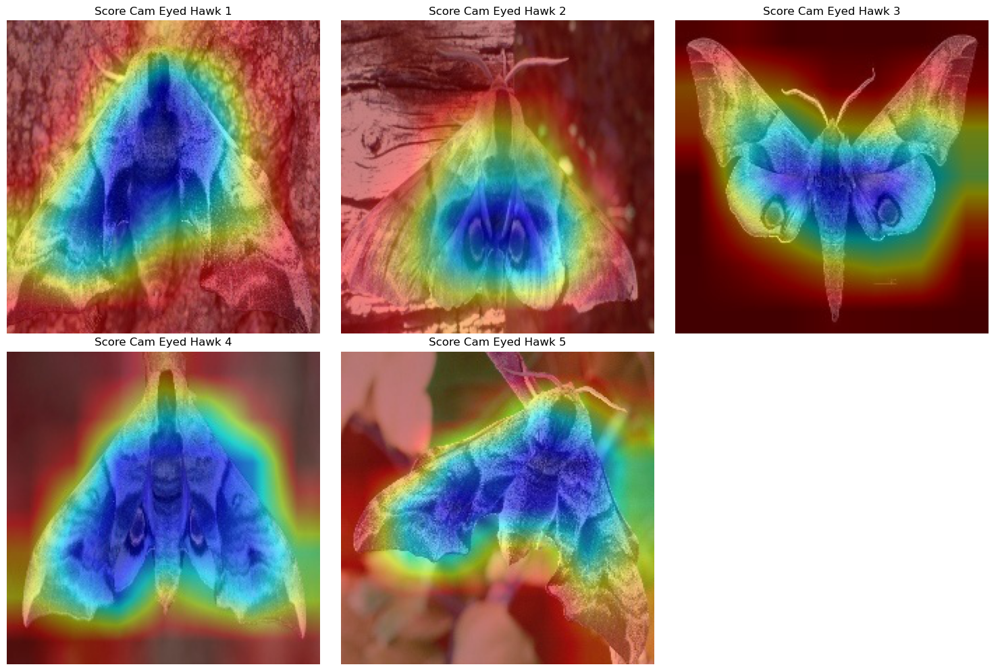

In [109]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-eyed-hawk-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [113]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-banded-tiger-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:27<00:00,  2.92it/s]


True

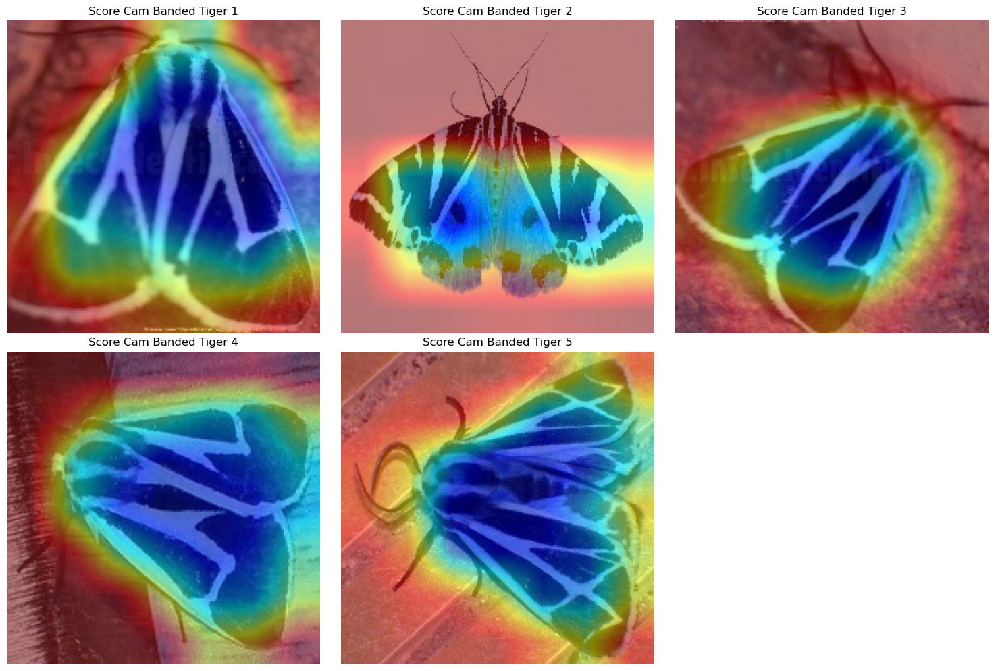

In [114]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-banded-tiger-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [119]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-garden-tiger-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:28<00:00,  2.77it/s]


True

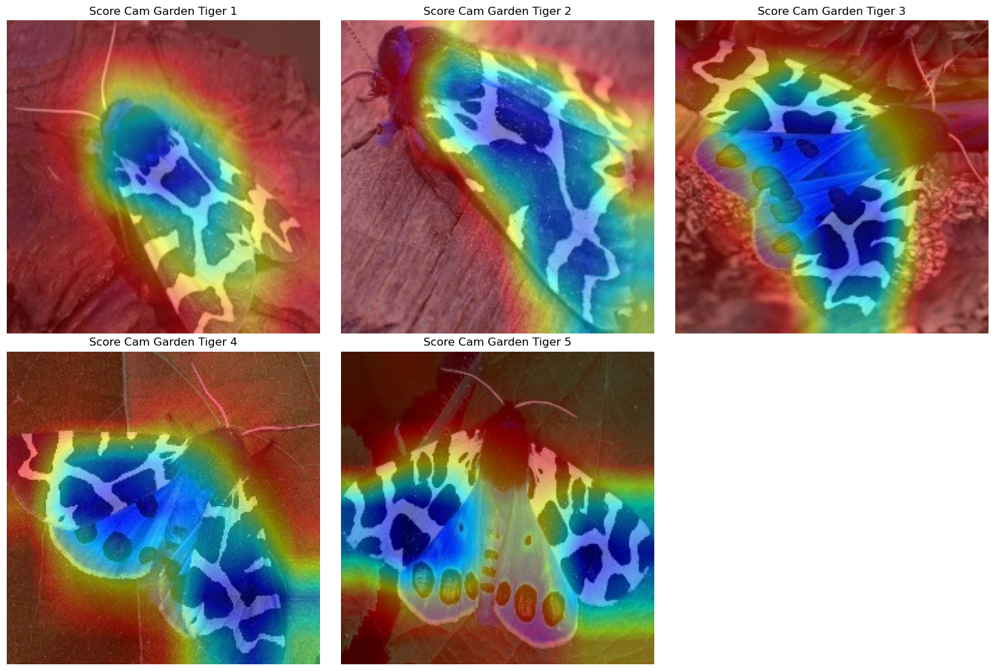

In [120]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-garden-tiger-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [127]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-muslin-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:14<00:00,  5.42it/s]


True

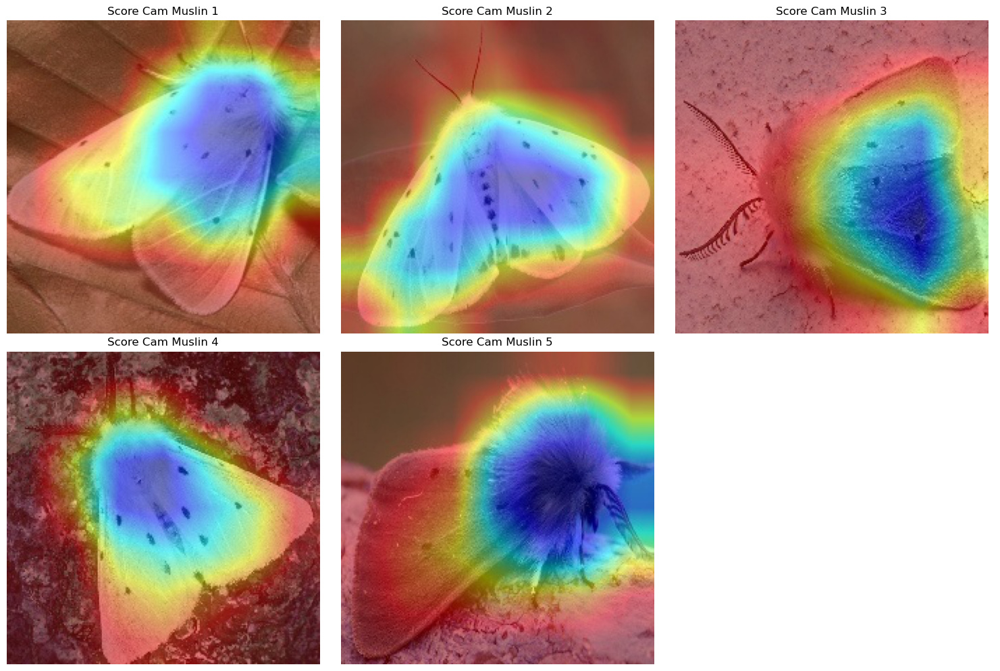

In [128]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-muslin-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [133]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-square-spot-rustic-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 80/80 [00:13<00:00,  5.79it/s]


True

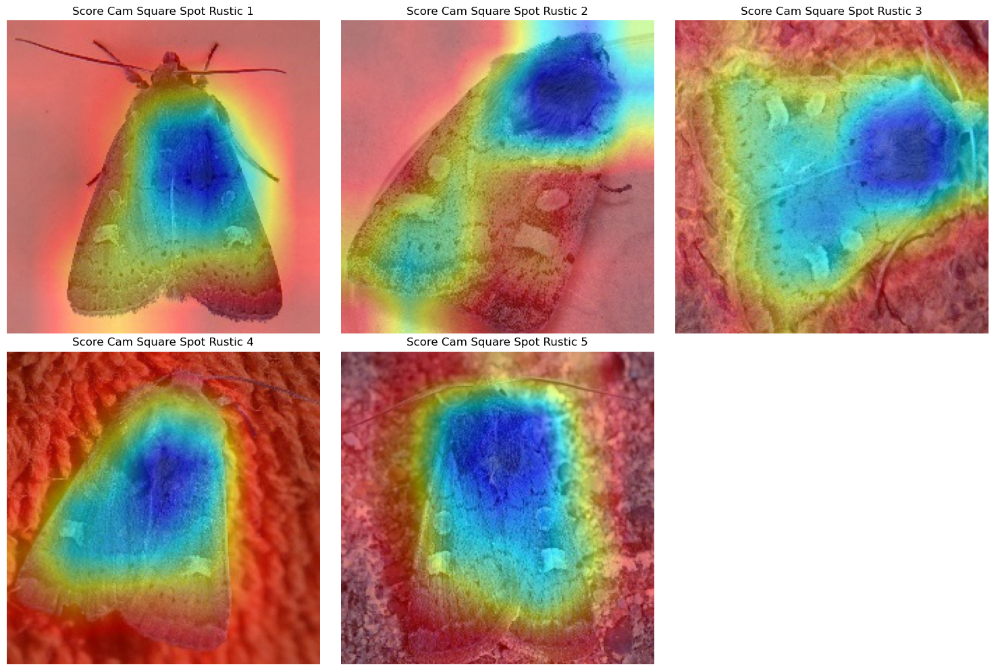

In [134]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-square-spot-rustic-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [139]:
# Device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Define model 
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 50)  

# Load trained weights 
model.load_state_dict(torch.load("mobilenet_v2_partial_ft.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the image from confused moth species 
image_path = "../data/kaggle-dataset/archive/test/CLEARWING MOTH/5.jpg" 
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0  

# Use the same transform as the training code
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  

# Apply transform to the original PIL image
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Set target layer for MobileNetV2 
target_layer = model.features[18]  

# Initialise Score-CAM 
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2/score-cam-clearwing-5.jpg") 
cv2.imwrite(str(output_path), visualisation)

  4%|▍         | 3/80 [00:00<00:10,  7.54it/s]

100%|██████████| 80/80 [00:09<00:00,  8.01it/s]


True

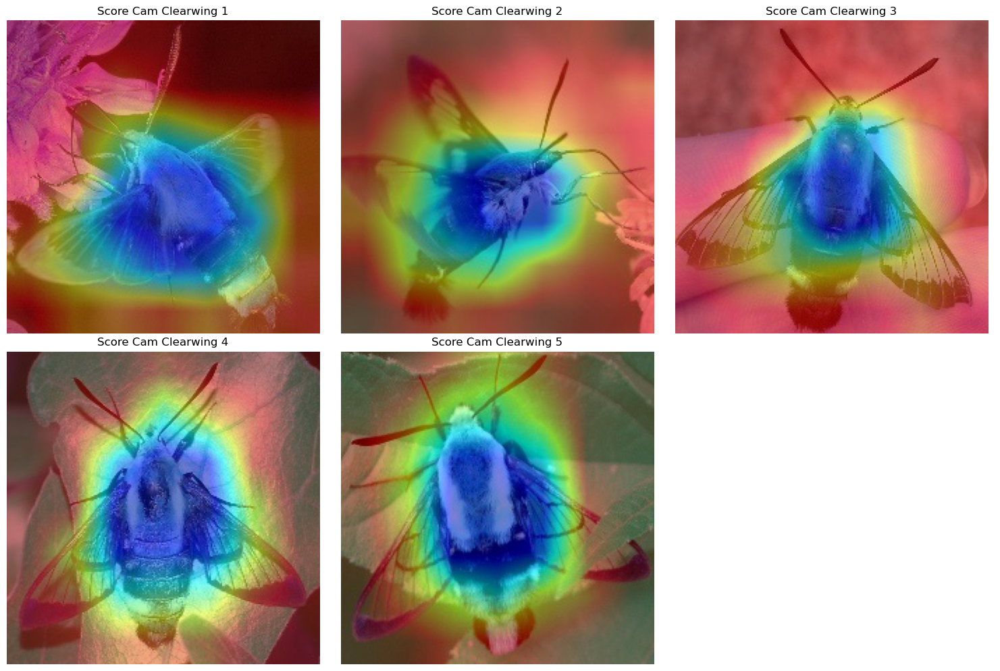

In [140]:
# Directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-clearwing-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()
